<div style="background-color:#564a48;
            border-radius:15px;
            font-size:100%;
            font-family:Verdana, Geneva, Tahoma, sans-serif;
            letter-spacing:1px;">
    <h1 style="padding: 20px;
               color:white;
               text-align:center;">
       📊 Diabetic Foot Ulcer (DFU) Dataset — Description
    </h1>
</div>



### Dataset Source:
The dataset is available on Kaggle:
👉 https://www.kaggle.com/datasets/laithjj/diabetic-foot-ulcer-dfu

### 🧠 What It Is

This dataset contains clinical images of human feet, collected for binary classification tasks:

Normal (healthy) feet

Abnormal (feet with diabetic foot ulcers)

### 🗂 Structure

The dataset typically includes multiple folders such as:

Original Images — raw pictures from clinical environments

Patches — cropped regions extracted from original images sized at 224×224 pixels

Test Set — images set aside for evaluation

Transfer Learning Images — intended for pre-trained model usage

### 📷 Image Characteristics

Color images

Captured under various lighting and angles

Common image sizes suitable for CNN input (e.g., 224×224 via preprocessing)

### 🎯 Classification Labels

The primary labels are:

Normal (no ulcer)

Abnormal / DFU present
These categories make it suitable for binary classification model training.



<div style="background-color:#564a48;
            border-radius:15px;
            font-size:100%;
            font-family:Verdana, Geneva, Tahoma, sans-serif;
            letter-spacing:1px;">
    <h1 style="padding: 20px;
               color:white;
               text-align:center;">
       Download Diabetic Foot Ulcer Dataset from Kaggle
    </h1>
</div>


In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
laithjj_diabetic_foot_ulcer_dfu_path = kagglehub.dataset_download('laithjj/diabetic-foot-ulcer-dfu')

print('Data source import complete.')


100%|██████████| 129M/129M [00:07<00:00, 18.0MB/s]

Extracting files...


Data source import complete.


<div style="background-color:#564a48;
            border-radius:15px;
            font-size:100%;
            font-family:Verdana, Geneva, Tahoma, sans-serif;
            letter-spacing:1px;">
    <h1 style="padding: 20px;
               color:white;
               text-align:center;">
       Import Libraries
    </h1>
</div>

In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.applications import EfficientNetB0, ResNet50
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras import optimizers
from tensorflow.keras import losses
from tensorflow.keras import callbacks
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

<div style="background-color:#564a48;
            border-radius:15px;
            font-size:100%;
            font-family:Verdana, Geneva, Tahoma, sans-serif;
            letter-spacing:1px;">
    <h1 style="padding: 20px;
               color:white;
               text-align:center;">
       Load Data
    </h1>
</div>



### Define Dataset Paths and Training Parameters

In [3]:
TRAIN_PATH = '../input/diabetic-foot-ulcer-dfu/DFU/Patches'
TEST_PATH = '../input/diabetic-foot-ulcer-dfu/DFU/TestSet'

BATCH_SIZE = 32
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224
NUM_CLASSES = 2
EPOCHS = 9

### Load and Prepare Training & Validation Datasets

In [4]:
TRAIN_PATH = os.path.join(laithjj_diabetic_foot_ulcer_dfu_path, 'DFU', 'Patches')
TEST_PATH = os.path.join(laithjj_diabetic_foot_ulcer_dfu_path, 'DFU', 'TestSet')

train_ds = image_dataset_from_directory(
    TRAIN_PATH,
    labels = 'inferred',
    validation_split = 0.2,
    batch_size = BATCH_SIZE,
    image_size = (IMAGE_HEIGHT, IMAGE_WIDTH),
    subset = 'training',
    seed = 0
)

validation_ds = image_dataset_from_directory(
    TRAIN_PATH,
    labels = 'inferred',
    validation_split = 0.2,
    batch_size = BATCH_SIZE,
    image_size = (IMAGE_HEIGHT, IMAGE_WIDTH),
    subset = 'validation',
    seed = 0
)

Found 1055 files belonging to 2 classes.
Using 844 files for training.
Found 1055 files belonging to 2 classes.
Using 211 files for validation.


### Display Class Names from Training Dataset

In [5]:
class_names = train_ds.class_names
print(class_names)

['Abnormal(Ulcer)', 'Normal(Healthy skin)']


### Visualize Sample Images from Training Dataset

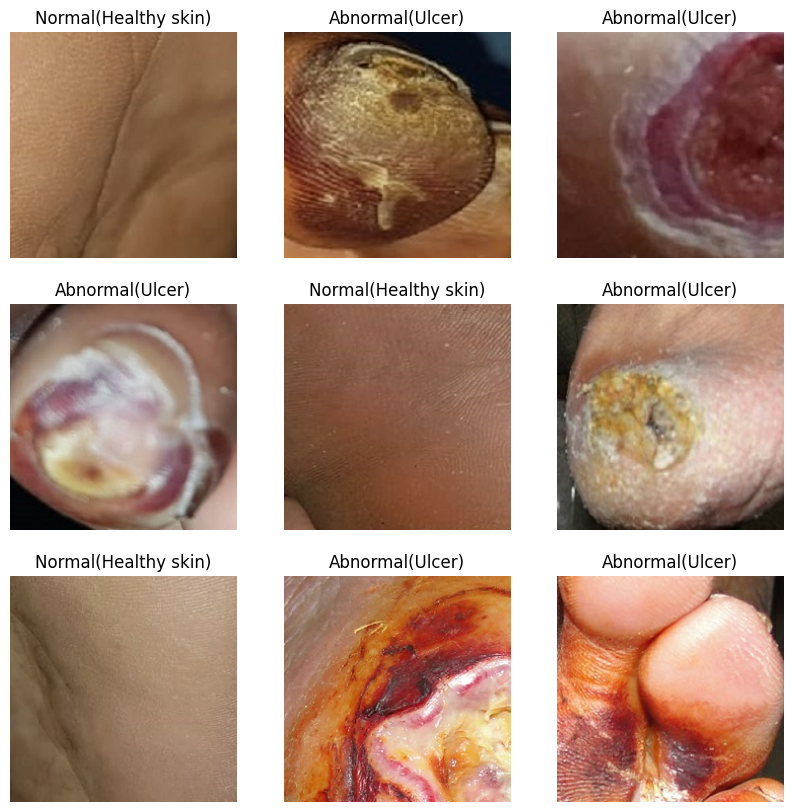

In [6]:
from matplotlib import figure
plt.figure(figsize=(10, 10))
for images,labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot( 3 ,3 , i + 1 )
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(class_names[labels[i]])
    plt.axis('off')

### Load and Preprocess Test Dataset

In [7]:
# Load Test Dataset
def decode_img(img):
  # Convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  # Resize the image to the desired size
  return tf.image.resize(img, [IMAGE_HEIGHT, IMAGE_WIDTH])

def process_path(file_path):
  # Load the raw data from the file as a string
  img = tf.io.read_file(file_path)
  img = decode_img(img)
  return img

test_ds = tf.data.Dataset.list_files(str(TEST_PATH + '/*'), shuffle=False)
# test_ds = test_ds.shuffle(len(os.listdir(TEST_PATH)), reshuffle_each_iteration=False)
test_ds = test_ds.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)


### Visualize Sample Images from Test Dataset

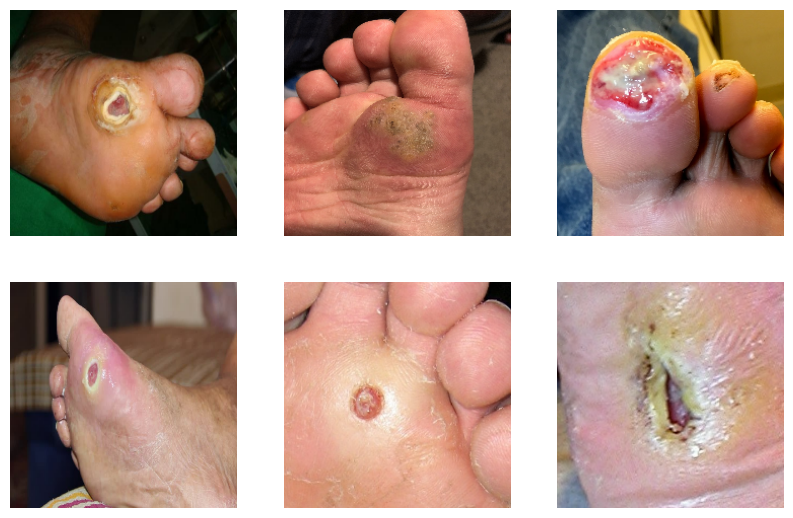

In [8]:
plt.figure(figsize = (10, 10))

i = 0
for images in test_ds.take(6):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images.numpy().astype("uint8"))
    plt.axis("off")
    i += 1


<div style="background-color:#564a48;
            border-radius:15px;
            font-size:100%;
            font-family:Verdana, Geneva, Tahoma, sans-serif;
            letter-spacing:1px;">
    <h1 style="padding: 20px;
               color:white;
               text-align:center;">
       Data Augmentation
    </h1>
</div>

### Define Image Augmentation Pipeline

In [9]:
img_augmentation = Sequential(
    [
        layers.RandomRotation(factor = 0.15),
        layers.RandomTranslation(height_factor = 0.1, width_factor = 0.1),
        layers.RandomFlip(),
        layers.GaussianNoise(stddev = 0.09),
        layers.RandomContrast(factor = 0.1),
    ],
    name = 'img_augmentation'
)

### Visualize Image Augmentations on Training Samples

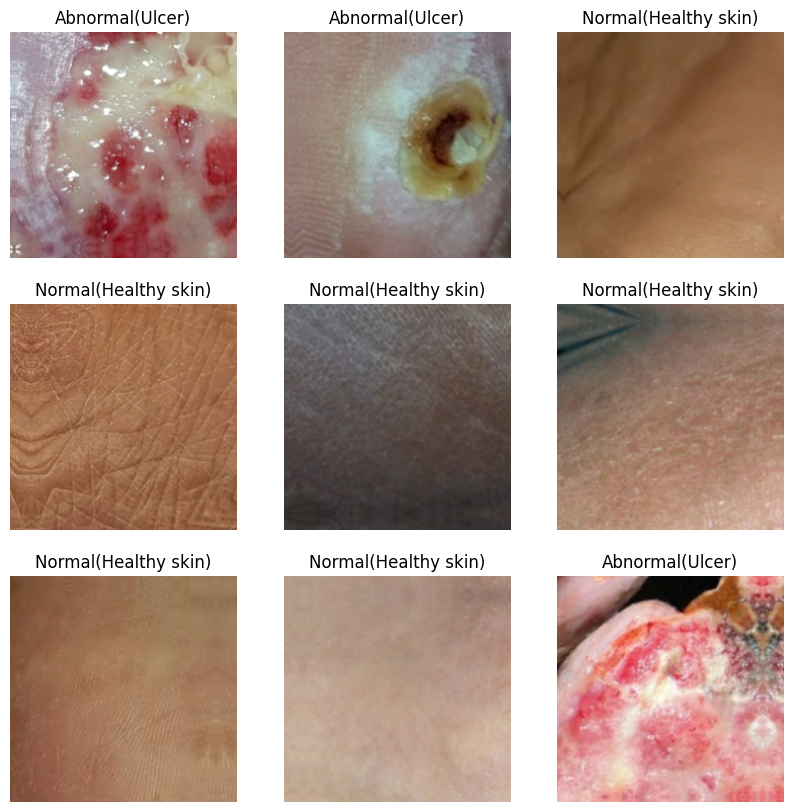

In [10]:
plt.figure(figsize = (10, 10))
for image, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        aug_img = img_augmentation(tf.expand_dims(image[i], axis = 0))
        plt.imshow(aug_img[0].numpy().astype("uint8")) # Changed aug_img[i] to aug_img[0]
        plt.title(class_names[labels[i]])
        plt.axis("off")

### Optimize Dataset Performance with Caching and Prefetching

In [11]:
# Caching and Prefetching (Optimization)
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size = AUTOTUNE)
validation_ds = validation_ds.cache().prefetch(buffer_size = AUTOTUNE)

<div style="background-color:#564a48;
            border-radius:15px;
            font-size:100%;
            font-family:Verdana, Geneva, Tahoma, sans-serif;
            letter-spacing:1px;">
    <h1 style="padding: 20px;
               color:white;
               text-align:center;">
       Building Model
    </h1>
</div>

### Define Callbacks for Learning Rate Scheduling and Early Stopping

In [12]:
lr_callbacks = callbacks.ReduceLROnPlateau(monitor='val_accuracy' , factor = 0.1, patience = 5)
stop_callbacks = callbacks.EarlyStopping(monitor = 'val_accuracy', patience = 8)

### Build and Compile EfficientNetB0 Model with Custom Top Layers

In [13]:
# Initialize Model
def build_model():
    inputs = layers.Input(shape = (IMAGE_WIDTH, IMAGE_HEIGHT, 3))
    x = img_augmentation(inputs)

    model = EfficientNetB0(include_top = False, weights = 'imagenet', input_tensor = x)

    # Rebuild top
    x = layers.GlobalAveragePooling2D(name="avg_pool")(model.output)
    x = layers.BatchNormalization()(x)

    top_dropout_rate = 0.4
    x = layers.Dropout(top_dropout_rate, name="top_dropout")(x)
    outputs = layers.Dense(NUM_CLASSES, activation = "sigmoid", name = "pred")(x)

    # Compile
    model = tf.keras.Model(inputs, outputs, name="EfficientNet")
    optimizer = optimizers.Adam(learning_rate=1e-3)
    loss = losses.SparseCategoricalCrossentropy()
    model.compile(
        optimizer=optimizer, loss=loss, metrics=["accuracy"]
    )

    model.summary()

    return model

### initialize EfficientNetB0 Model

In [14]:
model = build_model()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "EfficientNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ img_augmentation    │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ img_augmentation… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati

 Total params: 4,057,253 (15.48 MB)

 Trainable params: 4,012,670 (15.31 MB)

 Non-trainable params: 44,583 (174.16 KB)


<div style="background-color:#564a48;
            border-radius:15px;
            font-size:100%;
            font-family:Verdana, Geneva, Tahoma, sans-serif;
            letter-spacing:1px;">
    <h1 style="padding: 20px;
               color:white;
               text-align:center;">
       Training
    </h1>
</div>

### Train EfficientNetB0 Model on DFU Dataset

In [15]:
history = model.fit(train_ds, validation_data=validation_ds,
                    callbacks=[lr_callbacks, stop_callbacks],
                    epochs=EPOCHS, verbose=1)

Epoch 1/9
27/27 ━━━━━━━━━━━━━━━━━━━━ 53s 506ms/step - accuracy: 0.8468 - loss: 0.4233 - val_accuracy: 0.6540 - val_loss: 0.8303 - learning_rate: 0.0010
Epoch 2/9
27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 339ms/step - accuracy: 0.9725 - loss: 0.0906 - val_accuracy: 0.9289 - val_loss: 0.1389 - learning_rate: 0.0010
Epoch 3/9
27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 338ms/step - accuracy: 0.9722 - loss: 0.1495 - val_accuracy: 0.9384 - val_loss: 0.1425 - learning_rate: 0.0010
Epoch 4/9
27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 344ms/step - accuracy: 0.9826 - loss: 0.0817 - val_accuracy: 0.9716 - val_loss: 0.0658 - learning_rate: 0.0010
Epoch 5/9
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 364ms/step - accuracy: 0.9911 - loss: 0.0283 - val_accuracy: 0.9763 - val_loss: 0.1365 - learning_rate: 0.0010
Epoch 6/9
27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 347ms/step - accuracy: 0.9853 - loss: 0.0433 - val_accuracy: 0.9810 - val_loss: 0.0568 - learning_rate: 0.0010
Epoch 7/9
27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 350ms/step - accuracy: 0.9961 - loss: 0.0208 - val_a

### Training and Validation Accuracy over Epochs

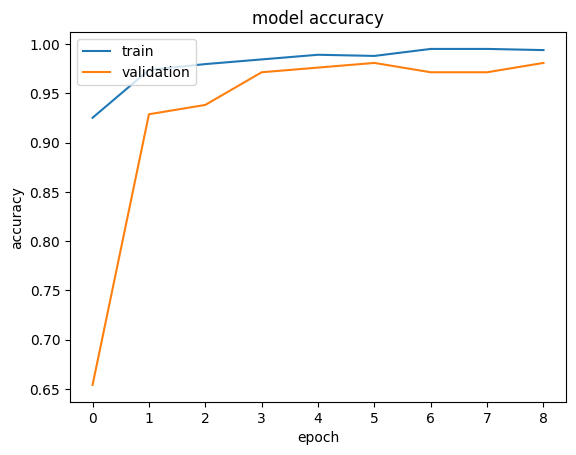

In [16]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### Training and Validation Loss over Epochs

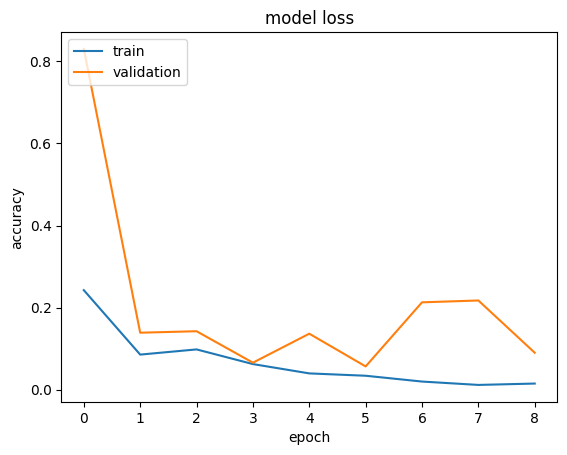

In [17]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("model loss")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

<div style="background-color:#564a48;
            border-radius:15px;
            font-size:100%;
            font-family:Verdana, Geneva, Tahoma, sans-serif;
            letter-spacing:1px;">
    <h1 style="padding: 20px;
               color:white;
               text-align:center;">
       Prediction
    </h1>
</div>

### Model Predictions on Training Samples

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


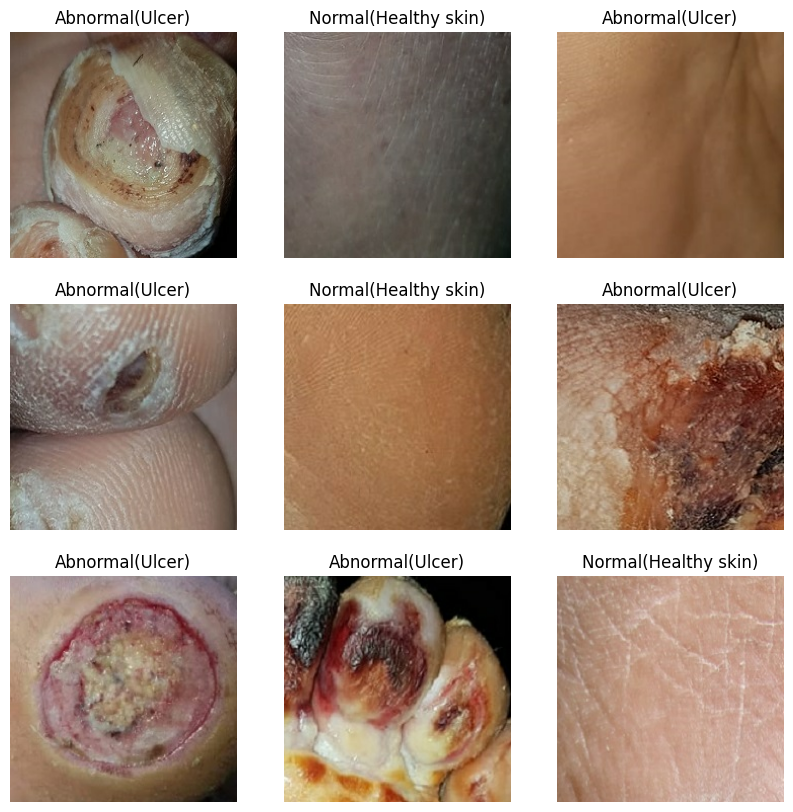

In [18]:
# Testing on Training Set
plt.figure(figsize = (10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        prediction = np.argmax(model.predict(np.array([images[i]])), axis = 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[prediction[0]])
        plt.axis("off")

### Model Predictions on Test Set

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


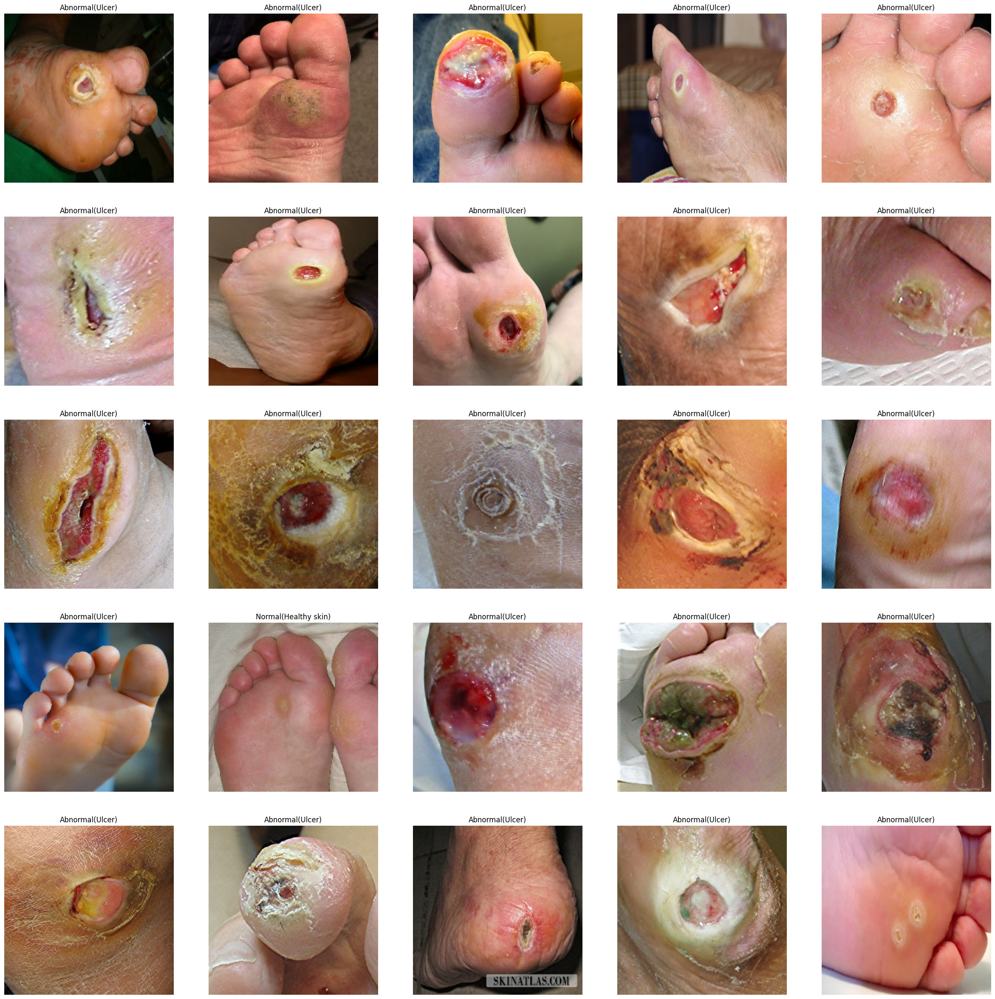

In [19]:
# Testing on Test Set
plt.figure(figsize = (30, 30))
plt.tight_layout()

i = 0
for images in test_ds.take(25):
    ax = plt.subplot(5, 5, i + 1)
    prediction = np.argmax(model.predict(np.array([images])), axis = 1)
    plt.imshow(images.numpy().astype("uint8"))
    plt.title(class_names[prediction[0]])
    plt.axis("off")

    i += 1

In [21]:
model.save('dfu_model.keras')